In [2]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
# sns.set_style('whitegrid')

# sns.set_context('notebook')

%matplotlib inline
plt.rcParams['figure.figsize'] = [4,4]
plt.rcParams['figure.dpi'] = 200
%config InlineBackend.figure_format ='retina'

%load_ext autoreload
%autoreload 2

import umap
import bz2


dev = 'cuda'
from utils import get_data

In [2]:
loc = '/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train'

In [3]:
y = np.repeat(np.arange(10), 1000).reshape([10000, 1])
class_map={0:'airplane', 1:'autombile', 2:'bird', 3:'cat', 4:'deer', 5:'dog', 6:'frog', 7:'horse', 8:'ship', 9:'truck'}

In [4]:
def get_r(w, n=10000, ne=3):

    e, v = th.linalg.eigh(w)

    e = e.cpu().numpy()
    v = v.cpu().numpy()
    ii = np.argsort(np.abs(e))[::-1]
    e,v = e[ii], v[:,ii]
    xp = v*np.sqrt(np.abs(e))
    r = dict(xp=xp,w=w,e=e,v=v)
    return r

/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_200_view.bz2
[-9.7259300e+01 -5.1460484e+01 -4.0907852e+01 ...  3.1930796e-07
 -2.7358681e-07 -1.9192682e-07]


Text(0.5, 1.0, 'epoch 200, layer view, inpca')

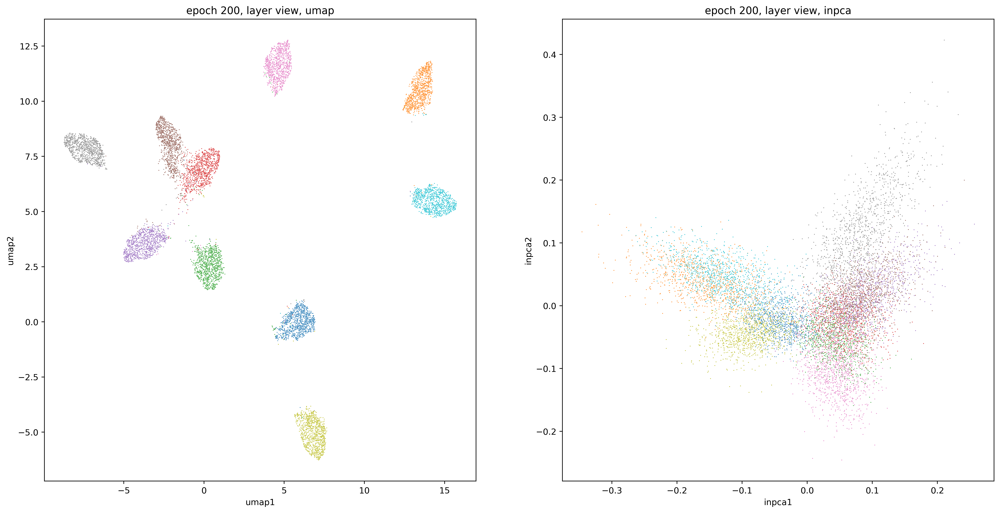

In [21]:
rs = []
fig, axes = plt.subplots(1, 2, sharex=False, figsize=(20,10))
layer = 'view'
exp = f'wide-resnet-10x4x8_200_{layer}.bz2'
fname = os.path.join(loc, exp)
with bz2.open(fname, "rb") as f:
    act = th.load(f).to(dev)
act = act.reshape([10000, -1])
print(fname)  
embedding = umap.UMAP().fit_transform(act.cpu())
data = pd.DataFrame(np.hstack([embedding, y]), columns=['umap1', 'umap2', 'class'])
data['class'] = data['class'].map(class_map)

sns.scatterplot(data=data, x="umap1", y="umap2", hue="class", s=1, ax=axes[0], legend=False)
axes[0].set_title(f'epoch 200, layer {layer}, umap')


normalized_act = th.nn.functional.softmax(act, dim=1)
idists = -th.log(th.sqrt(normalized_act) @ th.sqrt(normalized_act.T))
P = (th.eye(10000) - th.ones([10000, 10000]) / 10000).to(dev)
w = P @ idists @ P

r = get_r(w)
rs.append(r)
data = pd.DataFrame(np.vstack([r['xp'][:, 0], r['xp'][:, 1], y.flatten()]).T, columns=['inpca1', 'inpca2', 'class'])
th.save(data, f'{layer}_200_inpca.p')
data['class'] = data['class'].map(class_map)
print(r['e'])
sns.scatterplot(data=data, x='inpca1', y='inpca2', hue='class', s=1, ax=axes[1], legend=False)
axes[1].set_title(f'epoch 200, layer {layer}, inpca')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [75]:
# fig, axes = plt.subplots(1, 2, sharex=False, figsize=(20,10))
# layer = 'layer3'
# exp = f'wide-resnet-10x4x8_200_{layer}.bz2'
# fname = os.path.join(loc, exp)
# with bz2.open(fname, "rb") as f:
#     act = th.load(f).to(dev)
# act = act.reshape([10000, -1])
# print(fname)  
embedding = umap.UMAP().fit_transform(act.cpu())


Text(-14.997187500000003, 0.5, '')

<IPython.core.display.Javascript object>


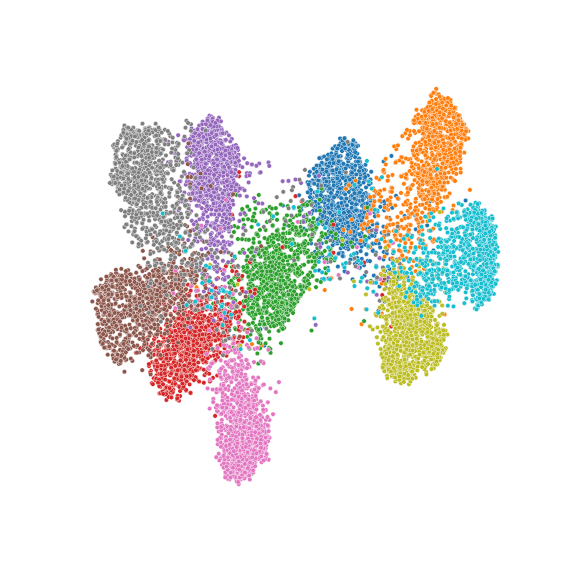

/tmp/ipykernel_4236/1686541237.py:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('umap.pdf', bbox_inches='tight', rasterized=True)


In [86]:
%matplotlib notebook
plt.xticks([], [])
plt.yticks([], [])
plt.xlabel("")
plt.ylabel("")
plt.axis("off")
plt.rcParams['figure.figsize'] = [4,4]
data = pd.DataFrame(np.hstack([embedding, y]), columns=['UMAP_1', 'UMAP_2', 'class'])
data['class'] = data['class'].map(class_map)
sns.scatterplot(data=data, x="UMAP_1", y="UMAP_2", hue="class", s=5, legend=False)
plt.savefig('umap.pdf', bbox_inches='tight', rasterized=True)

In [5]:
layer = 'layer3'
exp = f'wide-resnet-10x4x8_200_{layer}.bz2'
fname = os.path.join(loc, exp)
with bz2.open(fname, "rb") as f:
    act = th.load(f).to(dev)
act = act.reshape([10000, -1])

normalized_act = th.nn.functional.softmax(act, dim=1)
idists = -th.log(th.sqrt(normalized_act) @ th.sqrt(normalized_act.T))
P = (th.eye(10000) - th.ones([10000, 10000]) / 10000).to(dev)
w = -P @ idists @ P

[ 4.9906957e-01  2.4994858e-01  2.0233989e-01 ...  7.7746725e-09
 -4.4963575e-09  4.1627164e-09]


<IPython.core.display.Javascript object>


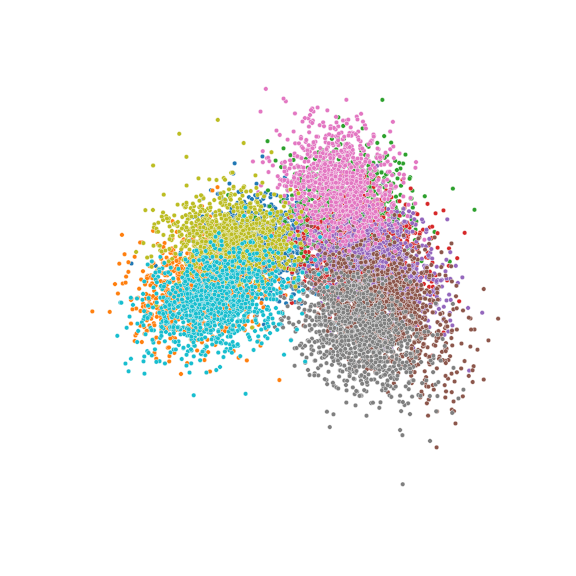

<AxesSubplot:xlabel='Principal Component 1', ylabel='Principal Component 2'>

In [84]:
# r = get_r(w)
data_ipca = pd.DataFrame(np.vstack([r['xp'][:, 0], r['xp'][:, 1], y.flatten()]).T, columns=['Principal Component 1', 'Principal Component 2', 'class'])
data_ipca['class'] = data_ipca['class'].map(class_map)
print(r['e'])
plt.xticks([], [])
plt.yticks([], [])
plt.xlabel("")
plt.ylabel("")
plt.axis("off")
plt.rcParams['figure.figsize'] = [4,4]
sns.scatterplot(data=data_ipca, x='Principal Component 1', y='Principal Component 2', s=5, hue='class', legend=False)
# axes[1].set_title(f'epoch 200, layer {layer}, inpca')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [85]:
plt.savefig('inpca.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_4236/2665848431.py:1: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('inpca.pdf', bbox_inches='tight', rasterized=True)


In [ ]:
r = get_r(w)
plt.yscale('log')
plt.xticks([], [])
plt.rcParams['figure.figsize'] = [3,6]
eigs = np.concatenate([r['e'][:100] ,r['e'][-100:]])
# plt.plot(r['e'])

<IPython.core.display.Javascript object>


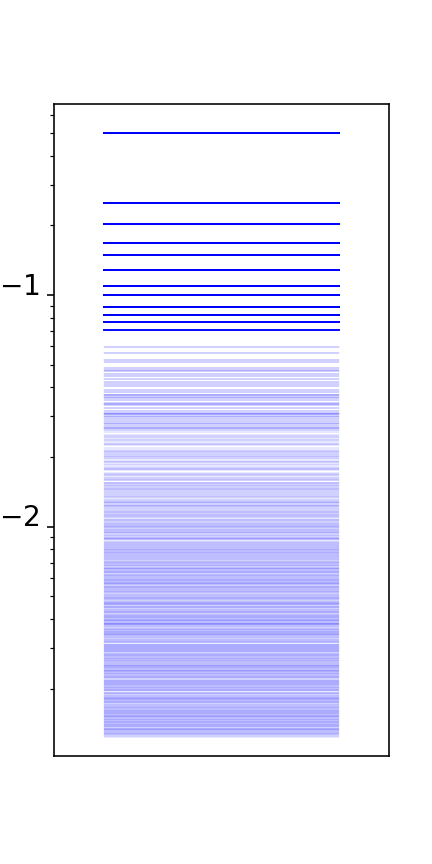

In [93]:
%matplotlib notebook
plt.yscale('log')
plt.xticks([], [])
plt.rcParams['figure.figsize'] = [4,6]
plt.yticks(fontsize=20)
# eigs = np.concatenate([r['e'][:5000] ,r['e'][-10:]])
eigs = r['e'][:500]
for (i, e) in enumerate(eigs):
    c = 'r' if e < 0 else 'b'
    if i == 0:
        lw = 1
    elif i < 12:
        lw = 1-np.exp(i-14)
    elif i < 50:
        lw = 1-np.exp(-0.2)
    else:
        lw = 1-np.exp(-0.1)
    plt.axhline(np.abs(e),  xmin=0.15, xmax=0.85, color=c, lw=lw)

In [94]:
plt.savefig('evals.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_4236/1718801816.py:1: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('evals.pdf', bbox_inches='tight', rasterized=True)


In [46]:
plt.savefig('inpca.pdf', bbox_inches='tight', rasterized=True)

/tmp/ipykernel_6472/2665848431.py:1: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('inpca.pdf', bbox_inches='tight', rasterized=True)


/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_200_layer2.bz2
[-3.0031638e+00 -2.6644294e+00 -1.5170238e+00 ...  1.0710342e-07
  5.8757713e-08 -3.3046778e-08]


Text(0.5, 1.0, 'epoch 200, layer layer2, inpca')

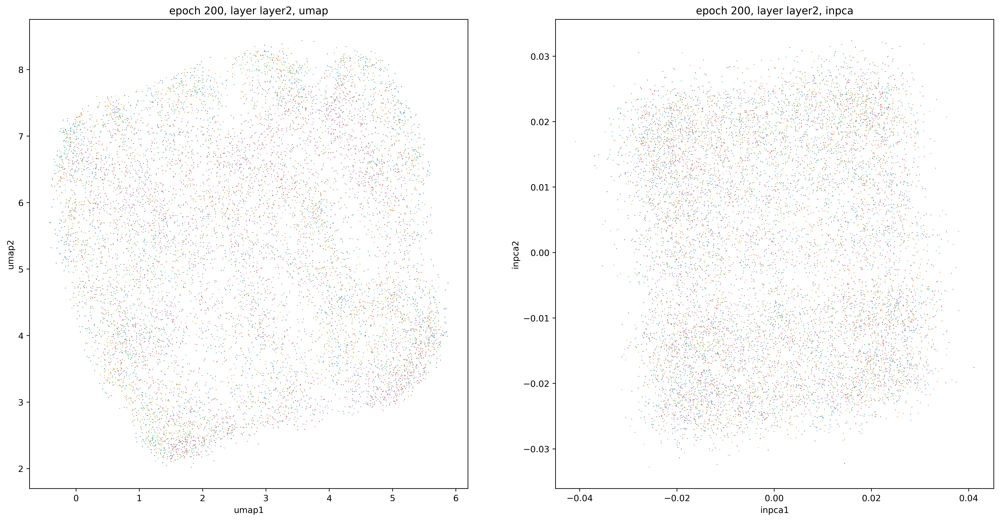

In [23]:
fig, axes = plt.subplots(1, 2, sharex=False, figsize=(20,10))
layer = 'layer2'
exp = f'wide-resnet-10x4x8_200_{layer}.bz2'
fname = os.path.join(loc, exp)
with bz2.open(fname, "rb") as f:
    act = th.load(f).to(dev)
act = act.reshape([10000, -1])
print(fname)  
embedding = umap.UMAP().fit_transform(act.cpu())
data = pd.DataFrame(np.hstack([embedding, y]), columns=['umap1', 'umap2', 'class'])
data['class'] = data['class'].map(class_map)

sns.scatterplot(data=data, x="umap1", y="umap2", hue="class", s=1, ax=axes[0], legend=False)
axes[0].set_title(f'epoch 200, layer {layer}, umap')


normalized_act = th.nn.functional.softmax(act, dim=1)
idists = -th.log(th.sqrt(normalized_act) @ th.sqrt(normalized_act.T))
P = (th.eye(10000) - th.ones([10000, 10000]) / 10000).to(dev)
w = P @ idists @ P

r = get_r(w)
rs.append(r)
data = pd.DataFrame(np.vstack([r['xp'][:, 0], r['xp'][:, 1], y.flatten()]).T, columns=['inpca1', 'inpca2', 'class'])
th.save(data, f'{layer}_200_inpca.p')
data['class'] = data['class'].map(class_map)

print(r['e'])
sns.scatterplot(data=data, x='inpca1', y='inpca2', hue='class', s=1, ax=axes[1], legend=False)
axes[1].set_title(f'epoch 200, layer {layer}, inpca')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

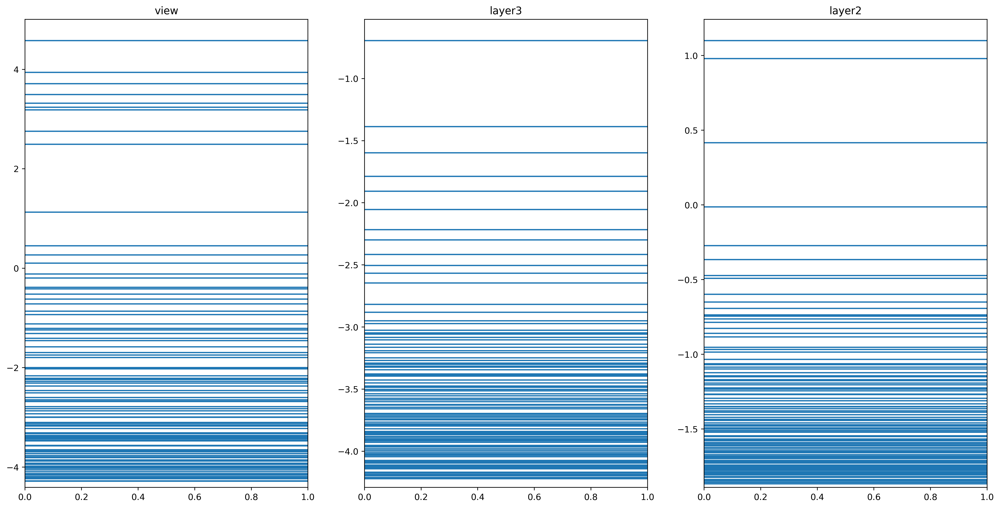

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(20, 10))
layers = ['view', 'layer3', 'layer2']
for i in range(3):
    for j in rs[i]['e'][:100]:
        axes[i].axhline(y=np.log(np.abs(j)))
        axes[i].set_title(layers[i])

/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_0_layer3.bz2
[-2616.783   -1256.8007   -986.2731   -726.0134   -671.7435    188.77335
   173.04013   104.65195    93.73476]
/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_100_layer3.bz2
[-5.1181369e+00 -2.3671634e+00 -1.9981718e+00 -1.7649219e+00
 -1.6467538e+00  5.6648208e-04  5.5028102e-04  5.2954373e-04
  4.7057189e-04]
/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_200_layer3.bz2


No handles with labels found to put in legend.


[-4.9906954e-01 -2.4994844e-01 -2.0233983e-01 -1.6738096e-01
 -1.4844593e-01  5.6904508e-05  5.5324421e-05  5.5138527e-05
  5.4999105e-05]


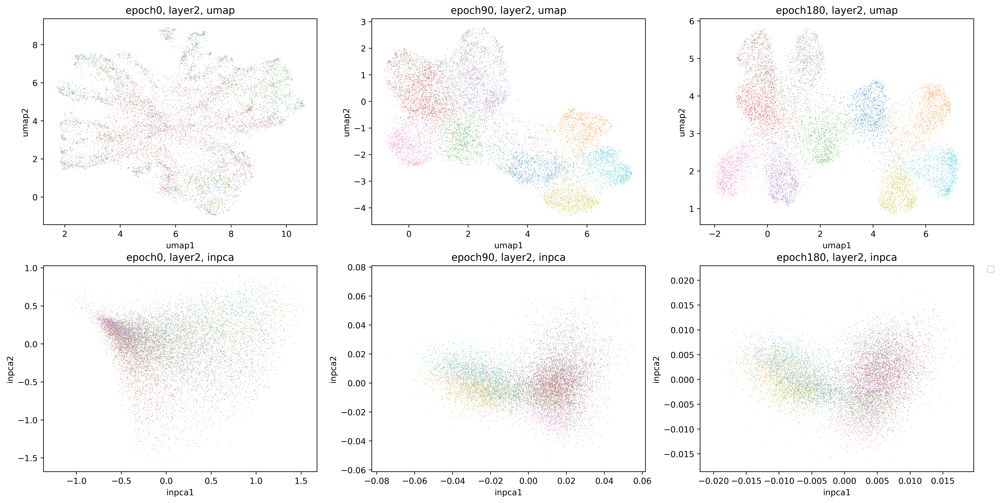

In [94]:
# rs = []
fig, axes = plt.subplots(2, 3, sharex=False, figsize=(20,10))
layers = ['layer3']
for i in range(3):
    for l in range(1):
        exp = f'wide-resnet-10x4x8_{(i)*100}_{layers[l]}.bz2'
        fname = os.path.join(loc, exp)
        with bz2.open(fname, "rb") as f:
            act = th.load(f).to(dev)
        act = act.reshape([10000, -1])
        print(fname)  
        embedding = umap.UMAP().fit_transform(act.cpu())
        data = pd.DataFrame(np.hstack([embedding, y]), columns=['umap1', 'umap2', 'class'])
        data['class'] = data['class'].map(class_map)
        
        sns.scatterplot(data=data, x="umap1", y="umap2", hue="class", s=0.5, ax=axes[l, i], legend=False)
        axes[l, i].set_title(f'epoch{i*90}, layer{l+2}, umap')
        

        normalized_act = th.nn.functional.softmax(act, dim=1)
        idists = -th.log(th.sqrt(normalized_act) @ th.sqrt(normalized_act.T))
        P = (th.eye(10000) - th.ones([10000, 10000]) / 10000).to(dev)
        w = P @ idists @ P

        r = get_r(w)
        rs.append(r)
        data = pd.DataFrame(np.vstack([r['xp'][:, 0], r['xp'][:, 1], y.flatten()]).T, columns=['inpca1', 'inpca2', 'class'])
        data['class'] = data['class'].map(class_map)
        print(r['e'])
        sns.scatterplot(data=data, x='inpca1', y='inpca2', hue='class', s=0.5, ax=axes[l+1, i], legend=False)
        axes[l+1, i].set_title(f'epoch{i*90}, layer{l+2}, inpca')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_0_layer2.bz2
[-1330.3138    -631.7542    -523.22266   -503.21027   -381.7527
    83.34352     45.4763      37.097965    31.751236]
/home/ubuntu/results/wide-resnet.pytorch/activations/cifar10/train/wide-resnet-10x4x8_100_layer2.bz2
[-1.7438604e+01 -1.3835263e+01 -7.9274187e+00 -5.1717339e+00
 -4.7940407e+00  3.3379560e-03  2.5876462e-03  2.5047762e-03
  2.3950292e-03]


KeyboardInterrupt: 

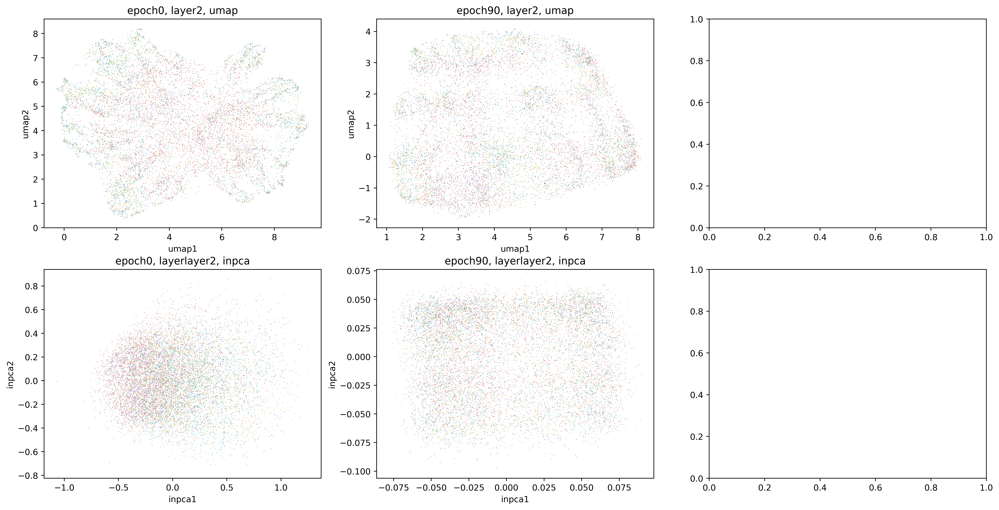

In [95]:
# rs = []
fig, axes = plt.subplots(2, 3, sharex=False, figsize=(20,10))
layers = ['layer2']
for i in range(3):
    for l in range(1):
        exp = f'wide-resnet-10x4x8_{(i)*100}_{layers[l]}.bz2'
        fname = os.path.join(loc, exp)
        with bz2.open(fname, "rb") as f:
            act = th.load(f).to(dev)
        act = act.reshape([10000, -1])
        print(fname)  
        embedding = umap.UMAP().fit_transform(act.cpu())
        data = pd.DataFrame(np.hstack([embedding, y]), columns=['umap1', 'umap2', 'class'])
        data['class'] = data['class'].map(class_map)
        
        sns.scatterplot(data=data, x="umap1", y="umap2", hue="class", s=0.5, ax=axes[l, i], legend=False)
        axes[l, i].set_title(f'epoch{i*90}, layer{l+2}, umap')
        

        normalized_act = th.nn.functional.softmax(act, dim=1)
        idists = -th.log(th.sqrt(normalized_act) @ th.sqrt(normalized_act.T))
        P = (th.eye(10000) - th.ones([10000, 10000]) / 10000).to(dev)
        w = P @ idists @ P

        r = get_r(w)
        rs.append(r)
        data = pd.DataFrame(np.vstack([r['xp'][:, 0], r['xp'][:, 1], y.flatten()]).T, columns=['inpca1', 'inpca2', 'class'])
        data['class'] = data['class'].map(class_map)
        print(r['e'])
        sns.scatterplot(data=data, x='inpca1', y='inpca2', hue='class', s=0.5, ax=axes[l+1, i], legend=False)
        axes[l+1, i].set_title(f'epoch{i*90}, layer{layers[l]}, inpca')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [73]:
w.min()

tensor(-0.0024, device='cuda:0')

[-3.4627466e+00 -1.6299644e+00 -1.4090190e+00 -1.0945060e+00
 -9.6621168e-01  2.9403111e-04  2.2272702e-04  2.0207342e-04
  1.7355179e-04]


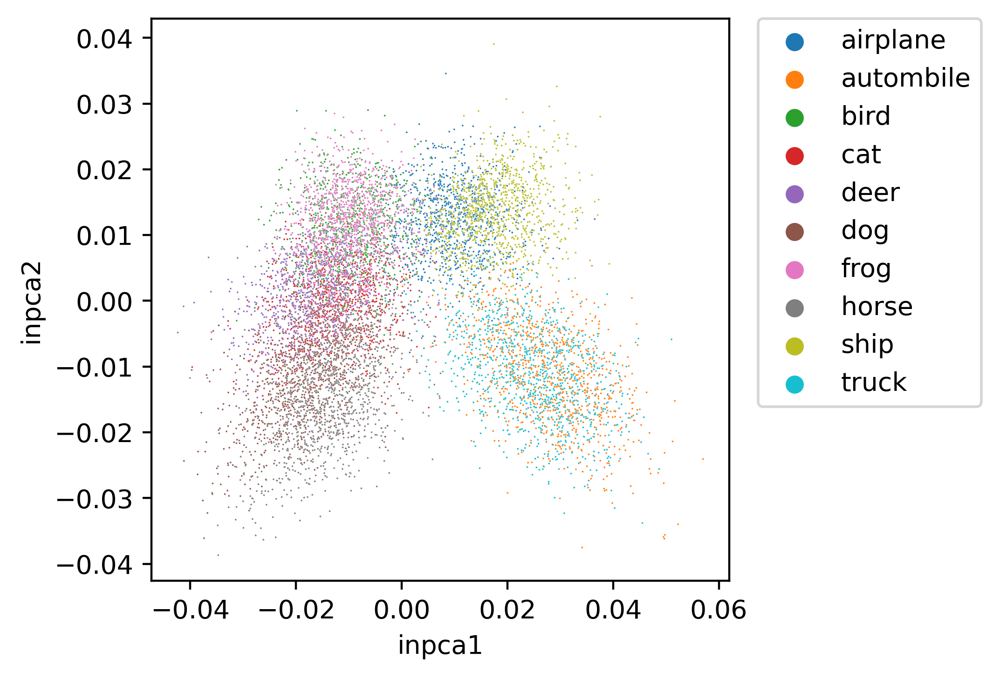

In [89]:
data = pd.DataFrame(np.vstack([r['xp'][:, 0], r['xp'][:, 1], y.flatten()]).T, columns=['inpca1', 'inpca2', 'class'])
data['class'] = data['class'].map(class_map)
print(r['e'])
sns.scatterplot(data=data, x='inpca1', y='inpca2', hue='class')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<IPython.core.display.Javascript object>


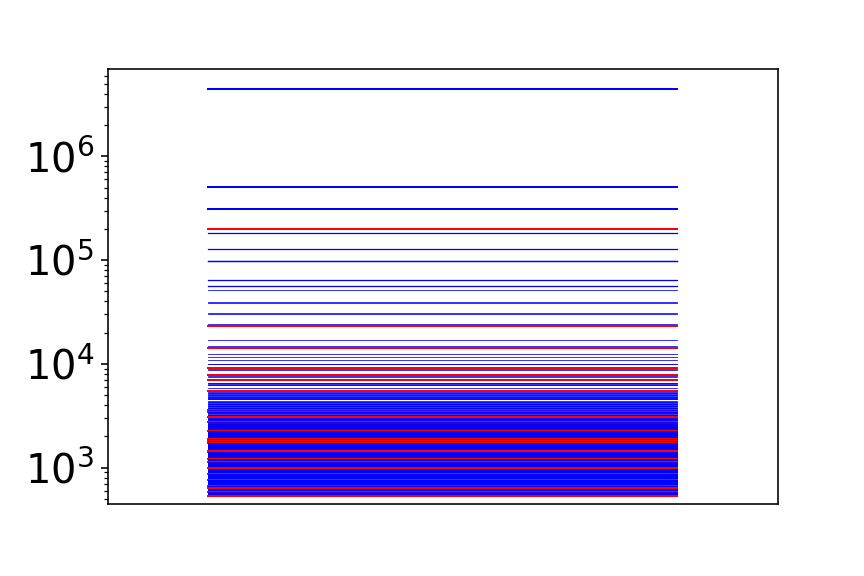

In [3]:
loc = 'inpca_results'
fn = 'yh_new_bn'
w = th.load(os.path.join(loc,'w_%s.p'%fn))

# w = w
e, v = th.linalg.eigh(th.Tensor(w).to(dev))

e = e.cpu().numpy()
v = v.cpu().numpy()

ii = np.argsort(np.abs(e))[::-1]
e,v = e[ii], v[:,ii]

%matplotlib notebook
plt.yscale('log')
plt.xticks([], [])
plt.rcParams['figure.figsize'] = [4,6]
plt.yticks(fontsize=20)
# eigs = np.concatenate([r['e'][:5000] ,r['e'][-10:]])
eigs = e[:500]
for (i, e_) in enumerate(eigs):
    c = 'r' if e_ < 0 else 'b'
    if i <3 or c == 'r':
        lw = 1
    elif i < 10:
        lw = 1-np.exp(-1)
    else:
        lw = 1-np.exp(-0.5)
    plt.axhline(np.abs(e_),  xmin=0.15, xmax=0.85, color=c, lw=lw)

In [4]:
e = th.load('evals_sgd_bn.p')
sum(e[:3]) / sum(e[e>0])

0.7353415441055984

In [5]:
e = th.load('evals_sgd.p')
print('pos', (e[0] + e[2]) / sum(e[e>0]))
print('neg', e[1] / sum(e[e<0]))

pos 0.7563306804143359
neg 0.8710087809712782


In [6]:
e = th.load('evals_full.p')
sum(e[:3]) / sum(e[e>0])

0.7720842694400892